In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler
import h5py
import collections
import scipy.sparse as sp_sparse
import tables
import rpy2.rinterface_lib.callbacks
import logging
import anndata2ri
import rpy2.robjects
from rpy2.robjects import pandas2ri
import scvelo as scv

In [2]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 4
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.2 pandas==1.1.0 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.7.1 louvain==0.6.1


In [3]:
sc.set_figure_params(scanpy=True, dpi=200)

In [5]:
adata1 = sc.read_loom('/Users/vyom/data/intestine/Arasco_data.loom')
adata1.var_names_make_unique()

In [6]:
adata1.obs


,Cell_Type,Cell_type,ClusterID,ClusterName,Type,integrated_snn_res_0_6,nCount_RNA,nCount_SCT,nFeature_RNA,nFeature_SCT,orig_ident,percent_mt,revival_markers1,seurat_clusters,stem1
Control_10_AAACCCACACCCTAAA-1,EP,EP,5,EP,Control,3,7345.0,6587.0,2659,2657,Control_10X,0.980259,1.926246,3,-1.332332
Control_10_AAACCCAGTCTGCGCA-1,TA,TA,4,TA,Control,9,6457.0,6285.0,2598,2598,Control_10X,4.444788,2.036656,9,-0.832131
Control_10_AAACCCATCAAGTAAG-1,Enterocyte,Enterocyte,6,Enterocyte,Control,5,8139.0,6650.0,2692,2681,Control_10X,6.229267,5.302990,5,-1.606912
Control_10_AAACCCATCCCTTGGT-1,Revival Stem 1,Revival Stem 1,2,Revival Stem 1,Control,12,6603.0,6334.0,2379,2379,Control_10X,8.117522,6.481119,12,-1.420478
Control_10_AAACCCATCCGCATAA-1,Enterocyte,Enterocyte,6,Enterocyte,Control,4,12637.0,6879.0,3741,3188,Control_10X,6.188178,3.003987,4,-1.455011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Arasco_11_TTTGTTGTCACCGGTG-1,Enterocyte,Enterocyte,6,Enterocyte,Arasco,4,5510.0,6003.0,2119,2119,AA_11x,5.989110,2.413455,4,-1.379847
Arasco_11_TTTGTTGTCCACCTCA-1,Stem,Stem,1,Stem,Arasco,1,5256.0,5903.0,2191,2190,AA_11x,8.523592,1.012403,1,3.412796
Arasco_11_TTTGTTGTCCATCTAT-1,Enterocyte,Enterocyte,6,Enterocyte,Arasco,0,6402.0,6409.0,2165,2165,AA_11x,12.792877,3.564341,0,-1.578029
Arasco_11_TTTGTTGTCGGTCTGG-1,TA,TA,4,TA,Arasco,7,8045.0,7047.0,2797,2797,AA_11x,9.546302,1.716667,7,3.602836


In [7]:
adata1.obs['n_counts'] = adata1.X.sum(1)
adata1.obs['log_counts'] = np.log(adata1.obs['n_counts'])
adata1.obs['n_genes'] = (adata1.X > 0).sum(1)

In [8]:
adata1.obsm['umap'] = adata1.obsm['umap_cell_embeddings']

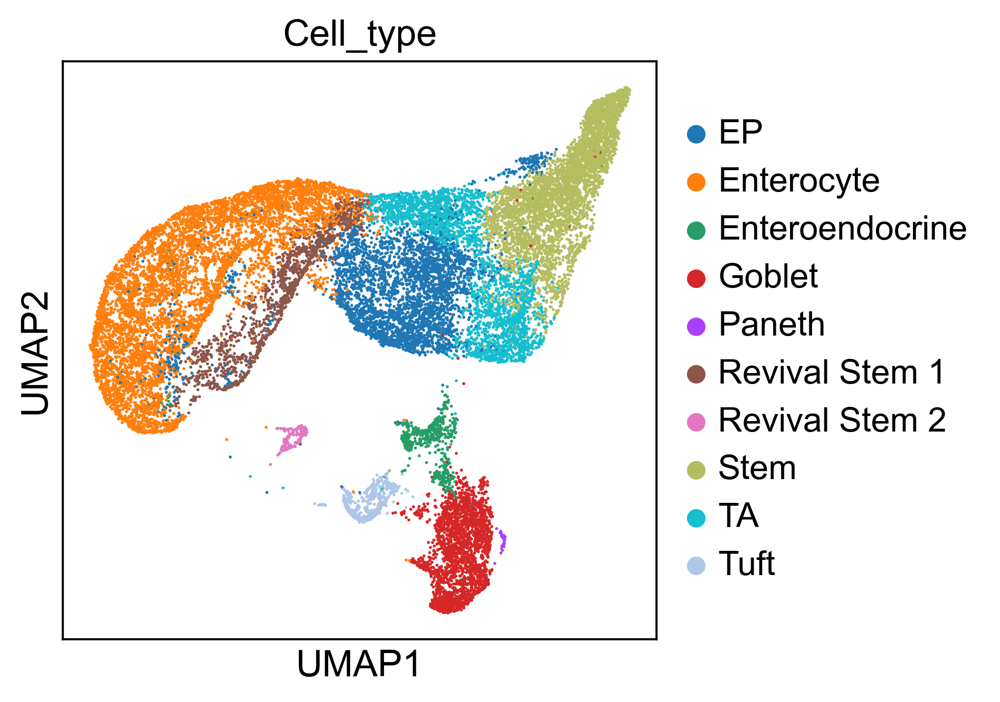

In [37]:
sc.pl.umap(adata1, color='Cell_type', save = "AnnoUMAP_arasco.svg")


In [38]:
adata2 = adata1.copy()

In [11]:
#clusters_to_include = [g for g in adata2.obs['Cell_type'].cat.categories if (g.startswith('Enterocyte') or g.startswith('Tr') or g.startswith('Stem') )]
#adata1 = adata2[np.isin(adata2.obs['Cell_type'], clusters_to_include),:].copy()

In [12]:
adatal = scv.read('/Users/vyom/data/SB10_SB11_results/Arasco.loom', cache=True)
adatal.var_names_make_unique()
scv.utils.show_proportions(adatal)
adatal

... reading from cache file cache/Users-vyom-data-SB10_SB11_results-Arasco.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Abundance of ['spliced', 'unspliced']: [0.75 0.25]


AnnData object with n_obs × n_vars = 34161 × 31053
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [39]:
adata = scv.utils.merge(adata1, adatal)

In [40]:
adata.obs

,Cell_Type,Cell_type,ClusterID,ClusterName,Type,integrated_snn_res_0_6,nCount_RNA,nCount_SCT,nFeature_RNA,nFeature_SCT,...,revival_markers1,seurat_clusters,stem1,n_counts,log_counts,n_genes,sample_batch,initial_size_spliced,initial_size_unspliced,initial_size
AAACCCACACCCTAAA,EP,EP,5,EP,Control,3,7345.0,6587.0,2659,2657,...,1.926246,3,-1.332332,-139.191635,NaN,478,Control_10_-1,4709,187,4709.0
AAACCCAGTCTGCGCA,TA,TA,4,TA,Control,9,6457.0,6285.0,2598,2598,...,2.036656,9,-0.832131,-294.347321,NaN,466,Control_10_-1,4018,1166,4018.0
AAACCCATCAAGTAAG,Enterocyte,Enterocyte,6,Enterocyte,Control,5,8139.0,6650.0,2692,2681,...,5.302990,5,-1.606912,216.822403,5.379078,623,Control_10_-1,5419,1310,5419.0
AAACCCATCCCTTGGT,Revival Stem 1,Revival Stem 1,2,Revival Stem 1,Control,12,6603.0,6334.0,2379,2379,...,6.481119,12,-1.420478,-250.418945,NaN,450,Control_10_-1,4066,1400,4066.0
AAACCCATCCGCATAA,Enterocyte,Enterocyte,6,Enterocyte,Control,4,12637.0,6879.0,3741,3188,...,3.003987,4,-1.455011,-244.750153,NaN,494,Control_10_-1,7940,2649,7940.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGTCACCGGTG,Enterocyte,Enterocyte,6,Enterocyte,Arasco,4,5510.0,6003.0,2119,2119,...,2.413455,4,-1.379847,-326.264313,NaN,275,Arasco_11_-1,3220,681,3220.0
TTTGTTGTCCACCTCA,Stem,Stem,1,Stem,Arasco,1,5256.0,5903.0,2191,2190,...,1.012403,1,3.412796,-198.851547,NaN,269,Arasco_11_-1,2753,2202,2753.0
TTTGTTGTCCATCTAT,Enterocyte,Enterocyte,6,Enterocyte,Arasco,0,6402.0,6409.0,2165,2165,...,3.564341,0,-1.578029,161.363663,5.083661,369,Arasco_11_-1,4144,924,4144.0
TTTGTTGTCGGTCTGG,TA,TA,4,TA,Arasco,7,8045.0,7047.0,2797,2797,...,1.716667,7,3.602836,-65.558624,NaN,355,Arasco_11_-1,4437,1531,4437.0


In [41]:
adata.var

,Selected,Accession,Chromosome,End,Start,Strand
Agr2,1.0,ENSMUSG00000020581,12,36004087,35992907,+
Reg1,1.0,ENSMUSG00000059654,6,78428667,78422711,+
Tff3,1.0,ENSMUSG00000024029,17,31129646,31125306,-
Fcgbp,1.0,ENSMUSG00000047730,7,28120862,28071236,+
Reg3b,1.0,ENSMUSG00000071356,6,78373466,78370657,+
...,...,...,...,...,...,...
Gm14508,1.0,ENSMUSG00000085376,5,116016105,116009316,+
Gm11724,1.0,ENSMUSG00000087669,11,117791313,117789897,-
Nme5,1.0,ENSMUSG00000035984,18,34579115,34562634,-
Cemip,1.0,ENSMUSG00000052353,7,84086502,83932857,-


In [42]:
scv.pp.filter_genes(adata, min_shared_counts=10)

Filtered out 958 genes that are detected 10 counts (shared).


In [43]:
scv.pp.normalize_per_cell(adata)

Normalized count data: spliced, unspliced.


In [44]:
scv.pp.filter_genes_dispersion(adata, n_top_genes=5000)

Skip filtering by dispersion since number of variables are less than `n_top_genes`.


In [45]:
scv.pp.log1p(adata)

In [46]:
scv.pp.filter_and_normalize(adata, min_shared_counts=30, n_top_genes=5000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 311 genes that are detected 30 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing PCA
    with n_comps=30
    finished (0:00:08)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    finished (0:00:09) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [47]:
adata.obs

,Cell_Type,Cell_type,ClusterID,ClusterName,Type,integrated_snn_res_0_6,nCount_RNA,nCount_SCT,nFeature_RNA,nFeature_SCT,...,revival_markers1,seurat_clusters,stem1,n_counts,log_counts,n_genes,sample_batch,initial_size_spliced,initial_size_unspliced,initial_size
AAACCCACACCCTAAA,EP,EP,5,EP,Control,3,7345.0,6587.0,2659,2657,...,1.926246,3,-1.332332,NaN,NaN,478,Control_10_-1,4709,187,4709.0
AAACCCAGTCTGCGCA,TA,TA,4,TA,Control,9,6457.0,6285.0,2598,2598,...,2.036656,9,-0.832131,NaN,NaN,466,Control_10_-1,4018,1166,4018.0
AAACCCATCAAGTAAG,Enterocyte,Enterocyte,6,Enterocyte,Control,5,8139.0,6650.0,2692,2681,...,5.302990,5,-1.606912,NaN,5.379078,623,Control_10_-1,5419,1310,5419.0
AAACCCATCCCTTGGT,Revival Stem 1,Revival Stem 1,2,Revival Stem 1,Control,12,6603.0,6334.0,2379,2379,...,6.481119,12,-1.420478,NaN,NaN,450,Control_10_-1,4066,1400,4066.0
AAACCCATCCGCATAA,Enterocyte,Enterocyte,6,Enterocyte,Control,4,12637.0,6879.0,3741,3188,...,3.003987,4,-1.455011,NaN,NaN,494,Control_10_-1,7940,2649,7940.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGTCACCGGTG,Enterocyte,Enterocyte,6,Enterocyte,Arasco,4,5510.0,6003.0,2119,2119,...,2.413455,4,-1.379847,NaN,NaN,275,Arasco_11_-1,3220,681,3220.0
TTTGTTGTCCACCTCA,Stem,Stem,1,Stem,Arasco,1,5256.0,5903.0,2191,2190,...,1.012403,1,3.412796,NaN,NaN,269,Arasco_11_-1,2753,2202,2753.0
TTTGTTGTCCATCTAT,Enterocyte,Enterocyte,6,Enterocyte,Arasco,0,6402.0,6409.0,2165,2165,...,3.564341,0,-1.578029,NaN,5.083661,369,Arasco_11_-1,4144,924,4144.0
TTTGTTGTCGGTCTGG,TA,TA,4,TA,Arasco,7,8045.0,7047.0,2797,2797,...,1.716667,7,3.602836,NaN,NaN,355,Arasco_11_-1,4437,1531,4437.0


In [76]:
adataa = adata.copy()

In [77]:
adatac = adata.copy()

In [78]:
scv.tl.velocity(adataa, groupby = "Type", groups = "Arasco",  mode='deterministic')
scv.tl.velocity_graph(adataa)

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:54) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [79]:
scv.tl.velocity(adatac, groupby = "Type", groups = "Control",  mode='deterministic')
scv.tl.velocity_graph(adatac)

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:57) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


Renamed 'umap' to convention 'X_umap' (adata.obsm).
computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_Velocity_ARAsco.svg


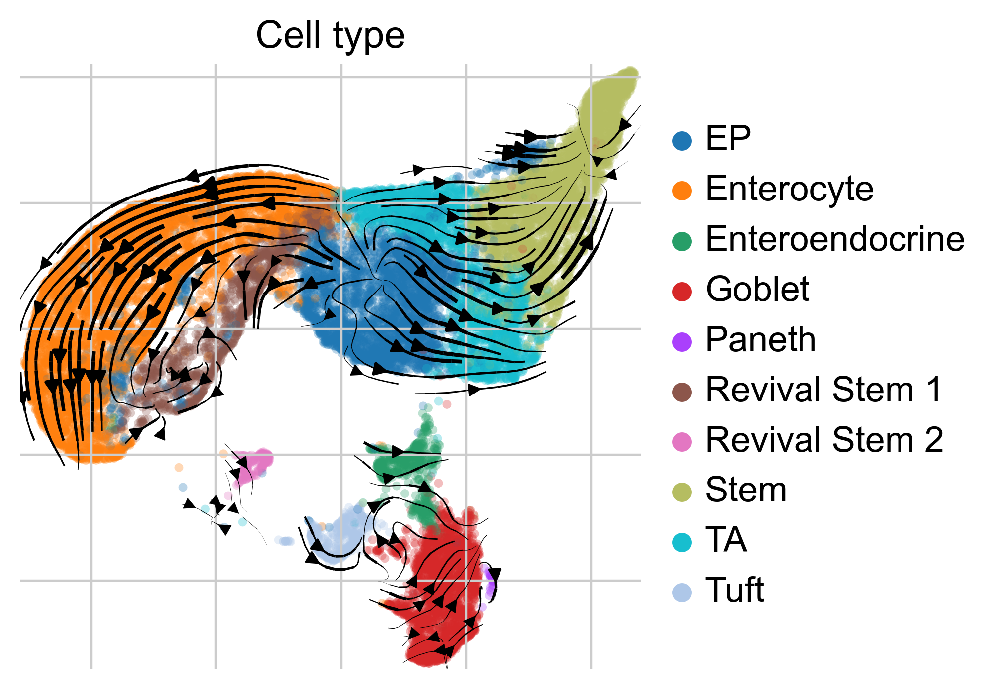

In [80]:
scv.pl.velocity_embedding_stream(adataa, basis='umap', color=['Cell_type'], legend_loc = 'right margin', save = "Velocity_ARAsco.svg")

Renamed 'umap' to convention 'X_umap' (adata.obsm).
computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_Velocity_controlARA.svg


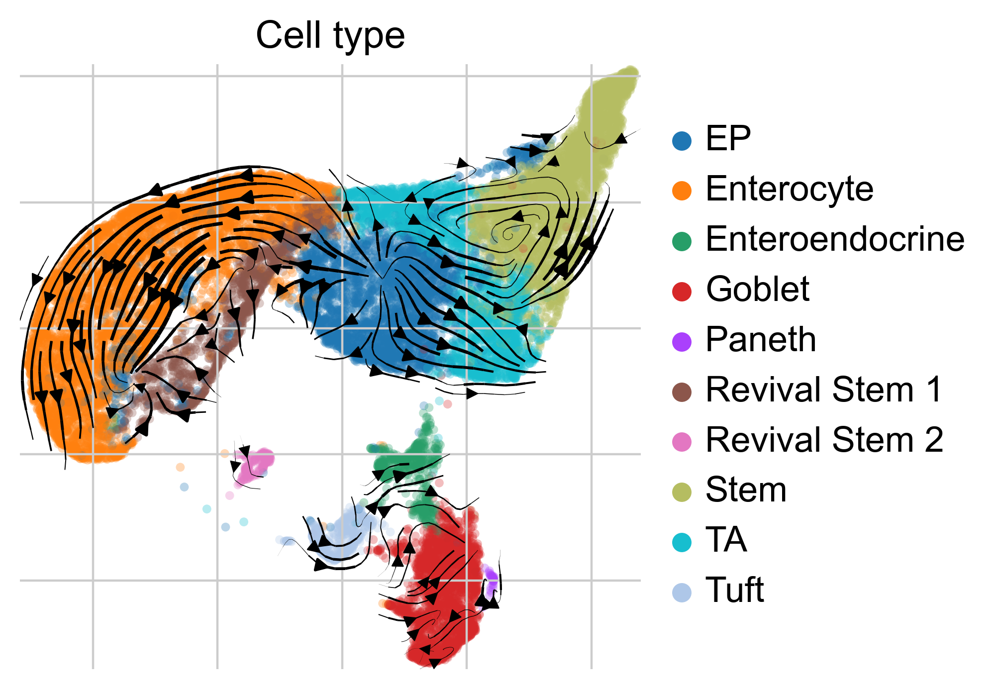

In [81]:
scv.pl.velocity_embedding_stream(adatac, basis='umap', color=['Cell_type'], legend_loc = 'right margin', save = "Velocity_controlARA.svg")

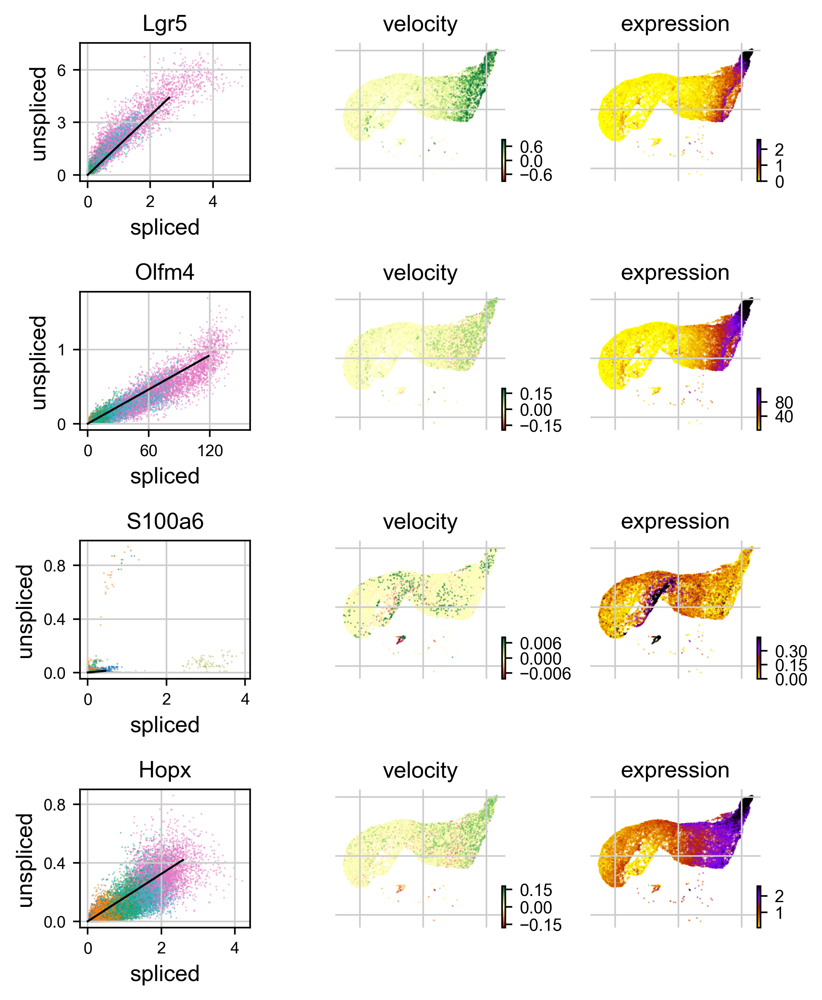

In [146]:
var_names = ['Lgr5', 'Ascl2', 'Olfm4', 'Clu', 'Ly6a', 'S100a6', 'Bmi1', 'Hopx', 'Lrig1', 'Mex3a']
scv.pl.velocity(adataa, var_names, colorbar=True, ncols=1, color=['Cell_type'])#, save = "Velocity_Phase_Portraits.svg"

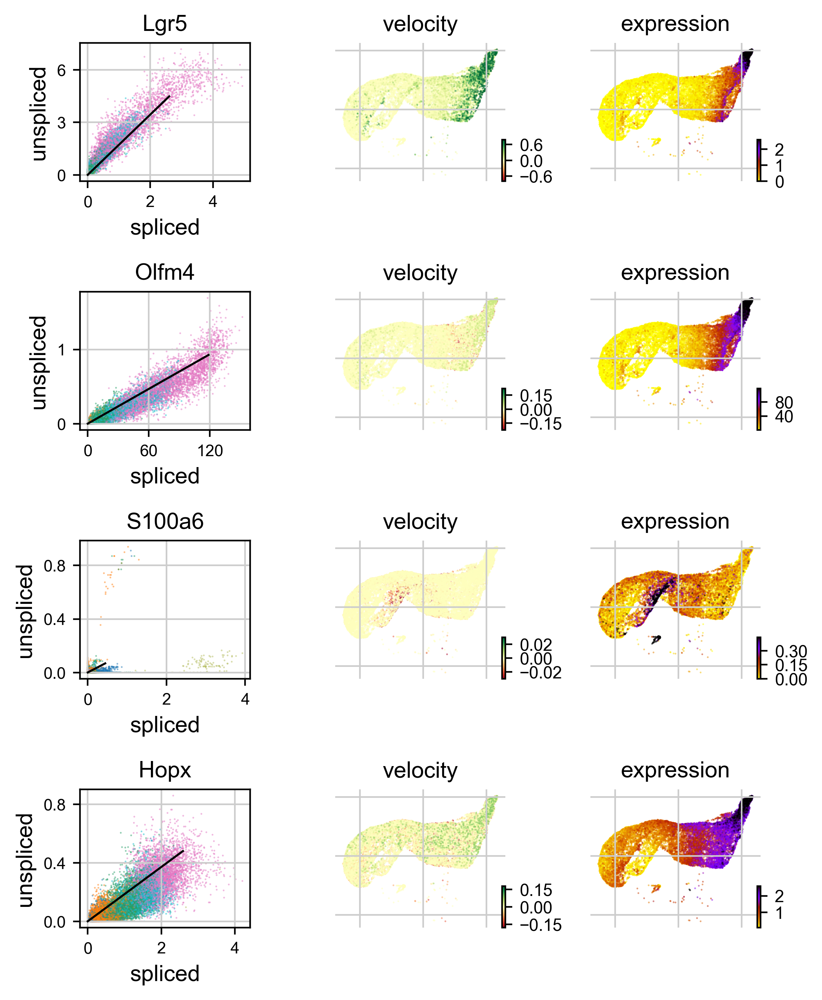

In [147]:
scv.pl.velocity(adatac, var_names, colorbar=True, ncols=1, color=['Cell_type'])#, save = "Velocity_Phase_Portraits.svg"

computing terminal states
    identified 0 region of root cells and 0 region of end points  (EP).
    identified 0 region of root cells and 0 region of end points  (Enterocyte).
    identified 1 region of root cells and 1 region of end points  (Enteroendocrine).
    identified 1 region of root cells and 0 region of end points  (Goblet).
    identified 0 region of root cells and 0 region of end points  (Paneth).
    identified 2 regions of root cells and 0 region of end points  (Revival Stem 1).
    identified 2 regions of root cells and 1 region of end points  (Revival Stem 2).
    identified 0 region of root cells and 0 region of end points  (Stem).
    identified 0 region of root cells and 0 region of end points  (TA).
    identified 1 region of root cells and 0 region of end points  (Tuft).
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


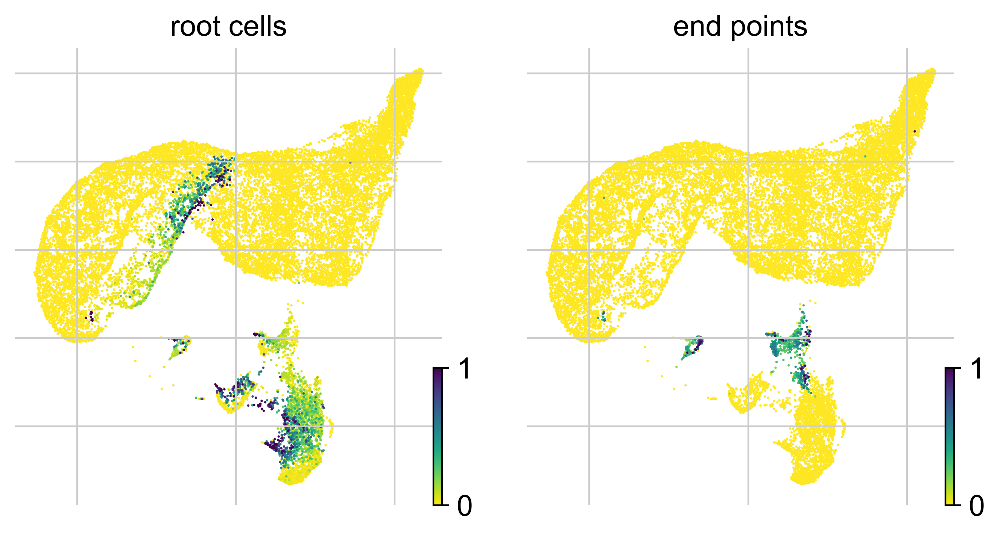

In [82]:
scv.tl.terminal_states(adatac, groupby='Cell_Type')
scv.pl.scatter(adatac, color=['root_cells', 'end_points'])

computing terminal states
    identified 0 region of root cells and 0 region of end points  (EP).
    identified 0 region of root cells and 0 region of end points  (Enterocyte).
    identified 0 region of root cells and 0 region of end points  (Enteroendocrine).
    identified 0 region of root cells and 0 region of end points  (Goblet).
    identified 1 region of root cells and 0 region of end points  (Paneth).
    identified 0 region of root cells and 0 region of end points  (Revival Stem 1).
    identified 0 region of root cells and 0 region of end points  (Revival Stem 2).
    identified 0 region of root cells and 0 region of end points  (Stem).
    identified 0 region of root cells and 0 region of end points  (TA).
    identified 0 region of root cells and 0 region of end points  (Tuft).
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


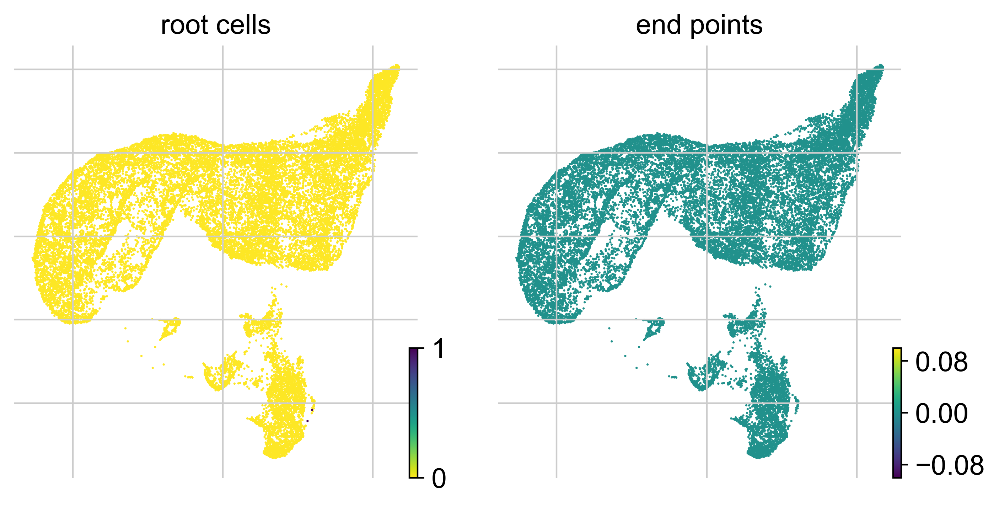

In [83]:
scv.tl.terminal_states(adataa, eps= 1e-10, groupby='Cell_type')
scv.pl.scatter(adataa, color=['root_cells', 'end_points'])

In [98]:
# this is needed due to a current bug - bugfix is coming soon.
adatac.uns['neighbors']['distances'] = adatac.obsp['distances']
adatac.uns['neighbors']['connectivities'] = adatac.obsp['connectivities']
scv.tl.paga(adatac, groups='Cell_type', threshold_root_end_prior = .5, use_time_prior=True, minimum_spanning_tree = True)
df = scv.get_df(adatac, 'paga/transitions_confidence', precision=4).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
        initialized `.distances` `.connectivities` 
    finished (0:00:05) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6,7,8,9
0,0,0.017,0,0,0,0,0,0,0.057,0
1,0,0,0,0,0,0.025,0,0,0,0
2,0.012,0,0,0,0,0,0,0.043,0,0
3,0,0,0.017,0,0,0,0,0,0,0.016
4,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0


In [89]:
# this is needed due to a current bug - bugfix is coming soon.
adataa.uns['neighbors']['distances'] = adataa.obsp['distances']
adataa.uns['neighbors']['connectivities'] = adataa.obsp['connectivities']

scv.tl.paga(adataa, groups='Cell_type', threshold_root_end_prior = .5, use_time_prior=True, minimum_spanning_tree = False)
df = scv.get_df(adataa, 'paga/transitions_confidence', precision=4).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
        initialized `.distances` `.connectivities` 
    finished (0:00:04) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6,7,8,9
0,0,0.062,0,0,0,0.03,0,0.075,0.061,0
1,0,0,0,0,0,0.021,0,0,0,0
2,0.02,0,0,0,0,0,0,0.058,0.04,0
3,0,0,0.021,0,0,0,0,0.035,0.026,0.011
4,0,0,0,0.037,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0
8,0,0.012,0,0,0,0,0,0.1,0,0
9,0,0,0,0,0,0,0,0.016,0.011,0


saving figure to file ./figures/scvelo_Arasco Paga Velocity.svg


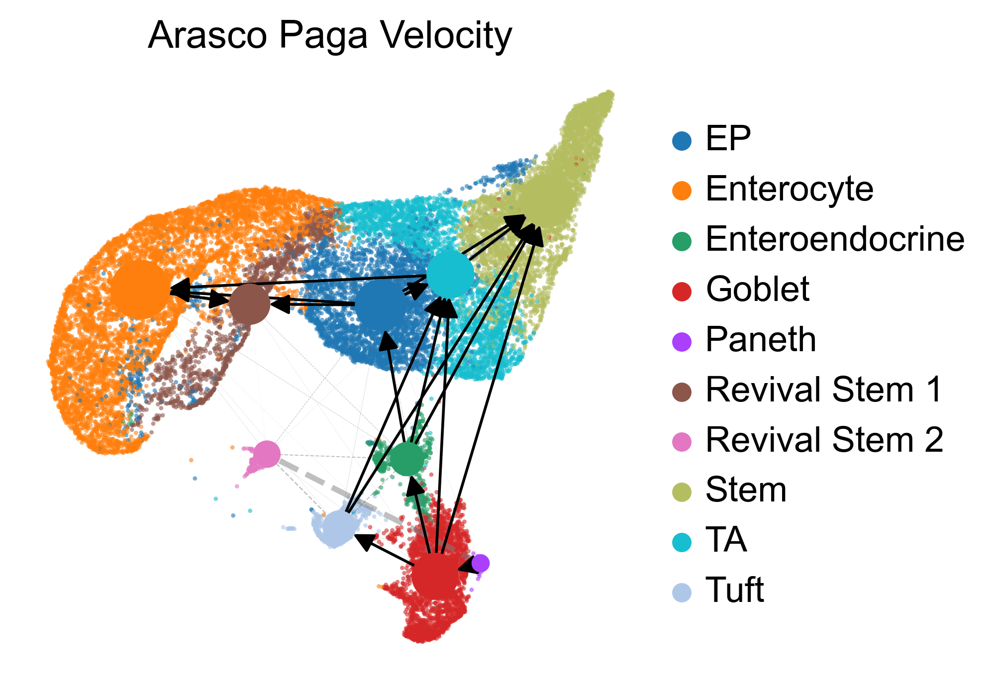

In [103]:
scv.pl.paga(adataa, basis='umap', threshold = 0.01 ,size=10, alpha=.6, min_edge_width=1, node_size_scale=1.5, init_pos = (5,5), title = "Arasco Paga Velocity", save = 'Arasco Paga Velocity.svg')


saving figure to file ./figures/scvelo_Control Paga Velocity.svg


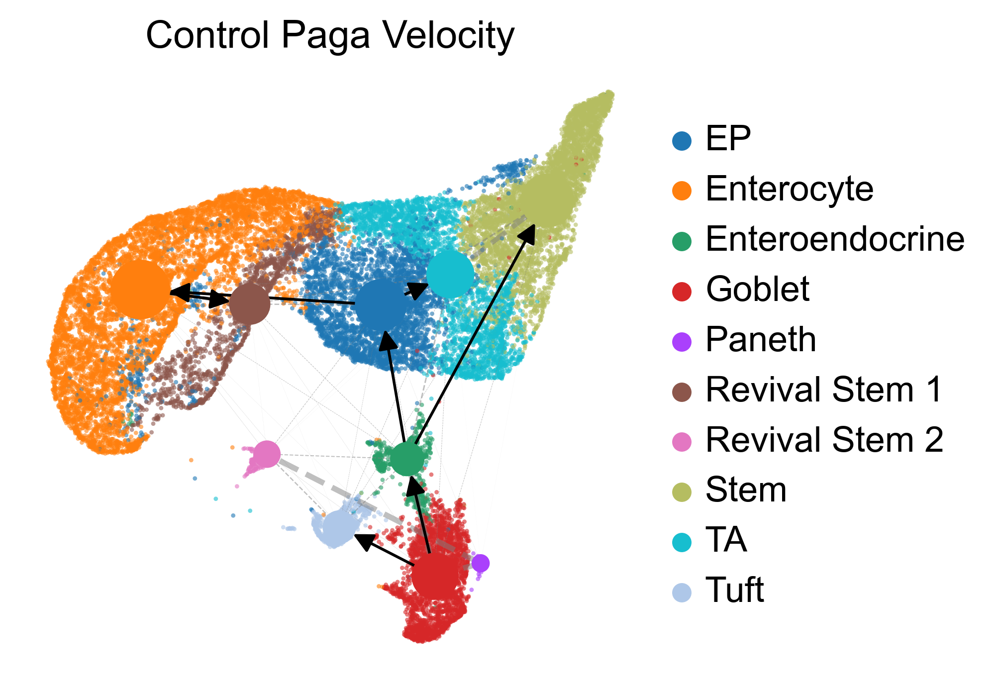

In [104]:
scv.pl.paga(adatac, basis='umap', threshold = 0.00 ,size=10, alpha=.6, min_edge_width=1, node_size_scale=1.5, init_pos = (5,5), title = "Control Paga Velocity", save = 'Control Paga Velocity.svg')


        initialized `.distances` `.connectivities` 


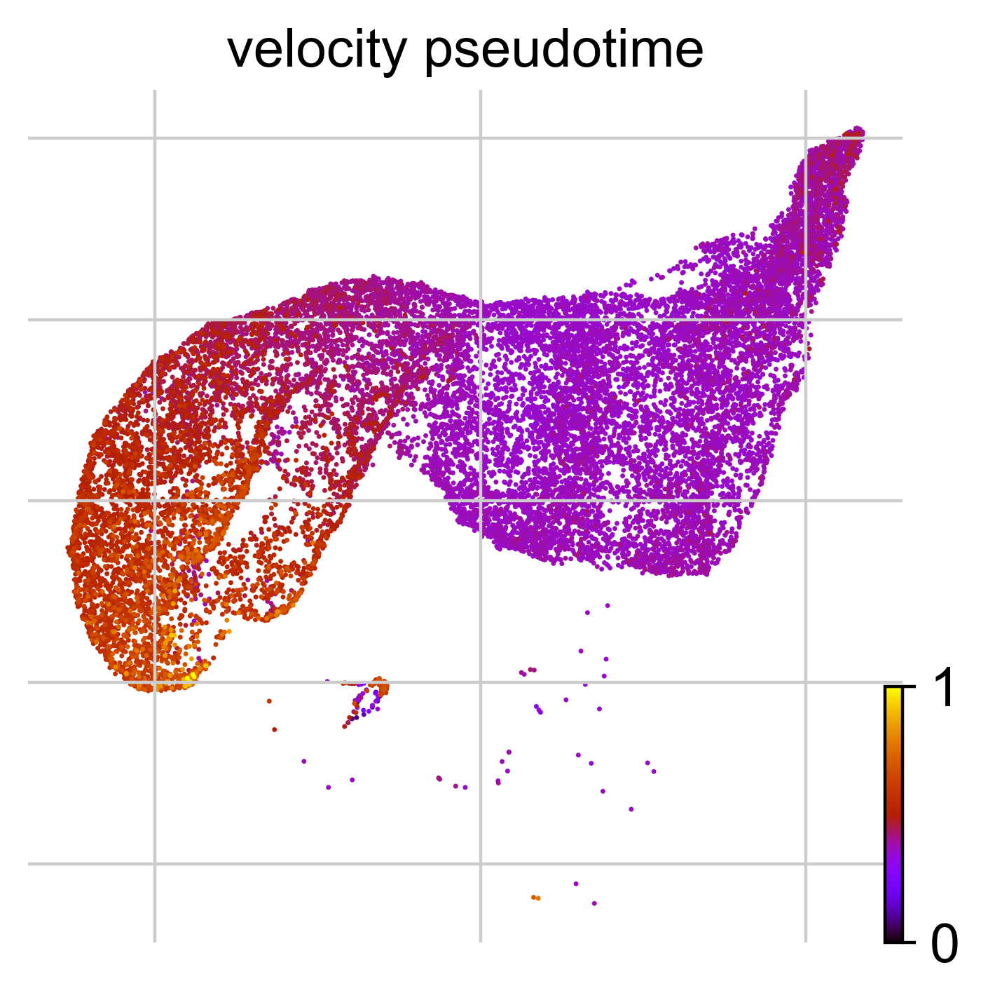

In [154]:
scv.tl.velocity_pseudotime(adataa)
scv.pl.scatter(adataa, color='velocity_pseudotime', cmap='gnuplot')


        initialized `.distances` `.connectivities` 


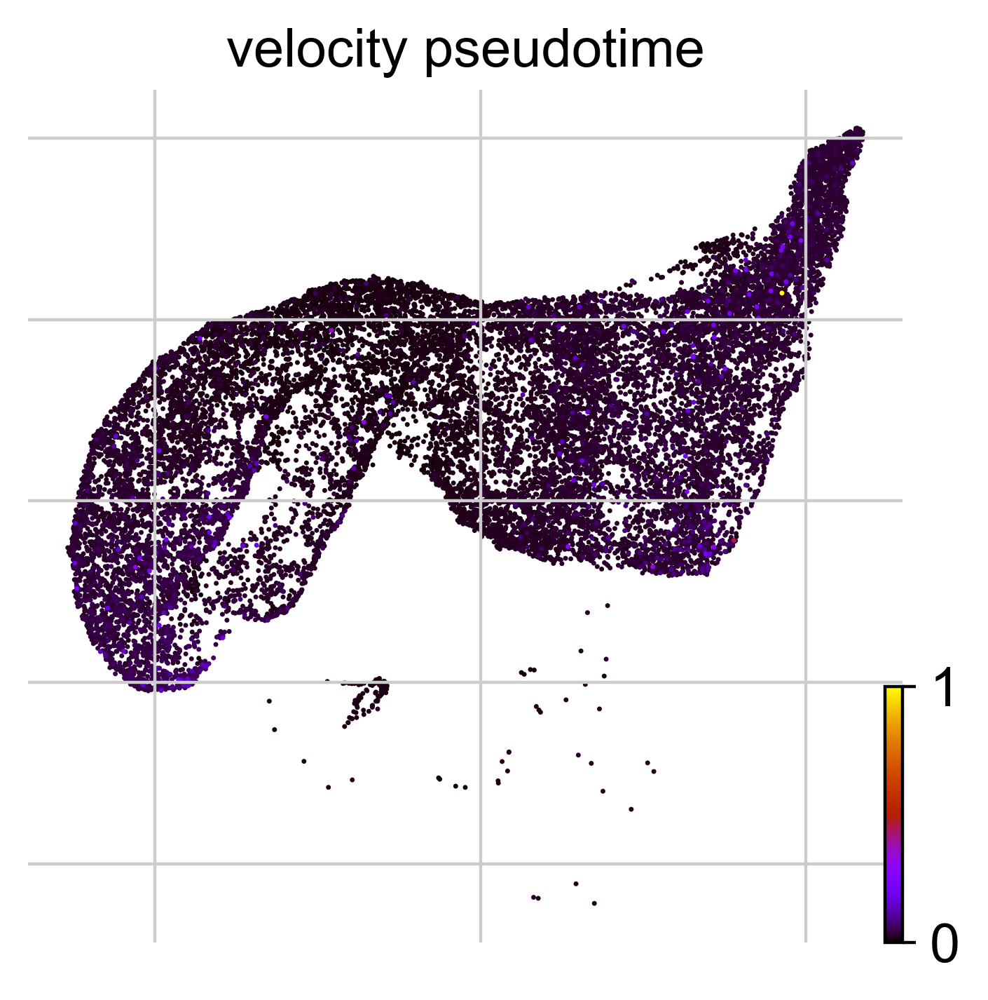

In [155]:
scv.tl.velocity_pseudotime(adatac)
scv.pl.scatter(adatac, color='velocity_pseudotime', cmap='gnuplot')

In [ ]:
#end